# Analysis of the Hospital ward dynamic contacts

[Data](https://networks.skewed.de/net/sp_hospital)

### Imports and loading the data

In [91]:
import pandas as pd
import networkx as nx
import matplotlib
import seaborn as sns
# %matplotlib notebook
import matplotlib.pyplot as plt
from pprint import pprint
import seaborn as sns
import numpy as np
from collections import Counter
import scipy

In [92]:
names_nodes = ["index", "id", "status", "_pos"]
nodes = pd.read_csv("./data/nodes.csv", delimiter=",", index_col=0, skiprows=1, names=names_nodes)

nodes.drop("id", axis=1, inplace=True)
nodes.drop("_pos", axis=1, inplace=True)

nodes

,status
index,
0,ADM
1,NUR
2,NUR
3,NUR
4,NUR
...,...
70,ADM
71,PAT
72,PAT


In [93]:
names_edges = ["source", "target", "time"]
edges = pd.read_csv("./data/edges.csv", delimiter=",", index_col=[0, 1], skiprows=1, names=names_edges)
start_tsp = int(pd.Timestamp(year=2010, month=12, day=6, hour=13).value / 10**9)
edges["timestamp"] = pd.to_datetime((start_tsp + edges['time']), unit='s')

edges

time           timestamp
source target                            
0      19        3980 2010-12-06 14:06:20
       16        4080 2010-12-06 14:08:00
       5         4280 2010-12-06 14:11:20
       5         4360 2010-12-06 14:12:40
       5         4380 2010-12-06 14:13:00
...               ...                 ...
69     74      336900 2010-12-10 10:35:00
       74      336980 2010-12-10 10:36:20
       72      341700 2010-12-10 11:55:00
       72      341800 2010-12-10 11:56:40
       72      341840 2010-12-10 11:57:20

[32424 rows x 2 columns]

In [94]:
edges_status = edges.reset_index() \
	.merge(nodes, left_on="source", right_index=True) \
	.merge(nodes, left_on="target", right_index=True) \
	.rename(columns={"status_x": "source_status", "status_y": "target_status"})

edges_status

,source,target,time,timestamp,source_status,target_status
0,0,19,3980,2010-12-06 14:06:20,ADM,NUR
52,0,19,71340,2010-12-07 08:49:00,ADM,NUR
530,0,19,156420,2010-12-08 08:27:00,ADM,NUR
531,0,19,156440,2010-12-08 08:27:20,ADM,NUR
532,0,19,156460,2010-12-08 08:27:40,ADM,NUR
...,...,...,...,...,...,...
31878,58,65,223440,2010-12-09 03:04:00,PAT,NUR
31879,58,65,232900,2010-12-09 05:41:40,PAT,NUR
31880,58,65,232920,2010-12-09 05:42:00,PAT,NUR
31881,58,65,233080,2010-12-09 05:44:40,PAT,NUR


## Analyzing the network
### Build the network

In [95]:
## Create undirected network
G = nx.Graph()
for idx, node in nodes.iterrows():
    G.add_node(idx, group=node["status"])

for idx, edge in edges.iterrows():
    G.add_edge(idx[0], idx[1], time=edge["time"], timestamp=edge["timestamp"])

### Draw the network

In [96]:
# Classes of Hospital People
classes = nodes['status'].unique()
class_to_int = {ci: matplotlib.pyplot.get_cmap("Set1").colors[i] for i, ci in enumerate(classes)}

#### Full network

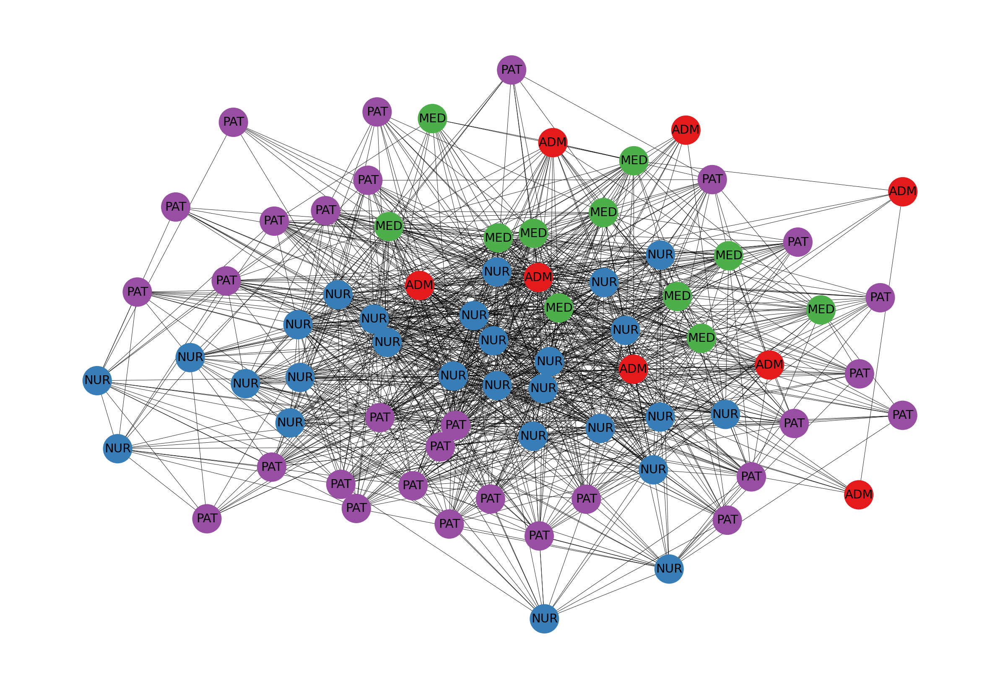

In [97]:
## Compute a layout
default_pos = nx.kamada_kawai_layout(G, scale=1)
default_node_labels = {ni: G.nodes[ni]["group"] for ni in G.nodes}

def plot_graph(graph, ax, node_size=250, node_labels=default_node_labels, pos=default_pos, colors=None):
    ## Fix a node ordering
    nodelist = graph.nodes
    ## Convert classes labels to numbers for plotting
    if colors is None:
        colors = [class_to_int[graph.nodes[ni]["group"]] for ni in nodelist]
    nx.draw_networkx(graph,
					 pos=pos,
					 node_size=node_size,
					 font_size=7,
					 width=0.2,  ## Edge width
					 nodelist=nodelist,
					 node_color=colors,
					 with_labels=True,
					 labels=node_labels,
                     cmap="coolwarm",
					 ## Label each node (student) with the class she attends
					 font_color="k",
					 ax=ax,
					 )
    ax.set_axis_off()

fig, ax1 = plt.subplots(figsize=(10, 7), dpi=300)
plot_graph(G, ax1)
plt.show()

### Staff anaylsis - static

In [98]:
def get_subgraph(groups):
    all_nodes = list(G.nodes(data=True))
    sub_nodes = []
    for node in all_nodes:
        idx = node[0]
        group = node[1]["group"]
        for g in groups:
            if group == g:
                sub_nodes.append(idx)
    return nx.subgraph(G, sub_nodes)

In [99]:
G_staff = get_subgraph(["MED", "ADM", "NUR"])
G_nurse = get_subgraph(["NUR"])
G_administrative = get_subgraph(["ADM"])
G_doctor = get_subgraph(["MED"])

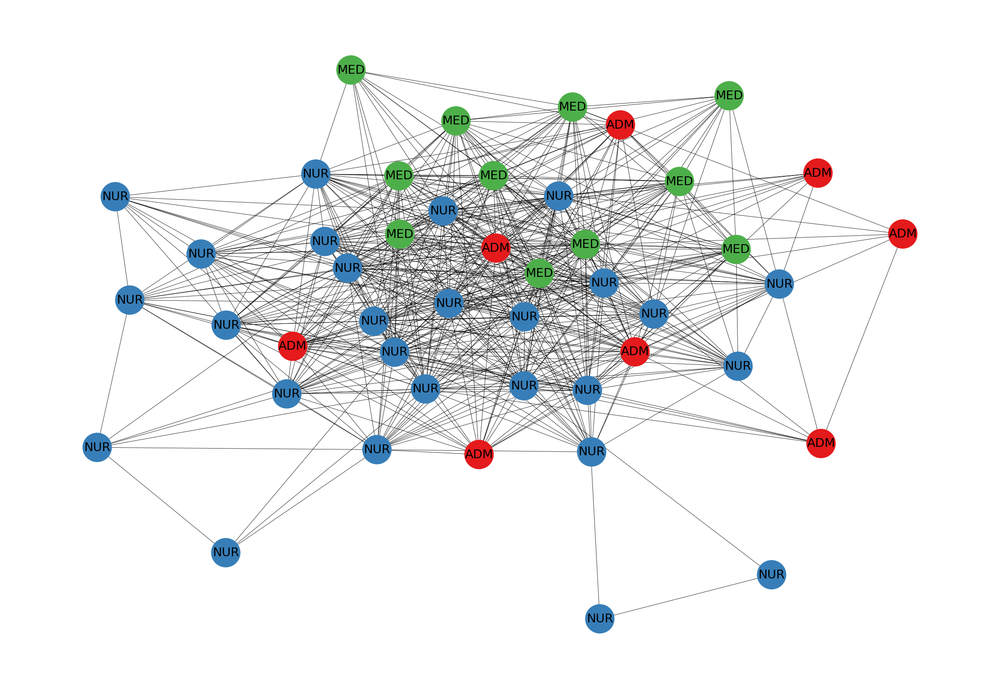

In [100]:
staff_pos = nx.kamada_kawai_layout(G_staff, scale=1)
staff_node_labels = {ni: G_staff.nodes[ni]["group"] for ni in G_staff.nodes}

fig, ax1 = plt.subplots(figsize=(10, 7), dpi=300)
plot_graph(G_staff, ax1, pos=staff_pos, node_labels=staff_node_labels)
plt.show()

In [101]:
def plot_group(G, ax=None, colors=None, node_labels=None):
    pos = nx.kamada_kawai_layout(G, scale=1)
    if node_labels is None:
        node_labels = {ni: ni for ni in G.nodes}

    if ax is None:
        fig, ax = plt.subplots(figsize=(10, 7), dpi=300)
    plot_graph(G, ax=ax, pos=pos, node_labels=node_labels, colors=colors)
    #plt.show()

In [102]:
def longest_path(G):
    longest_path_lengths = nx.all_pairs_dijkstra_path_length(G, weight=-1)
    max_length = 0
    for source, paths in longest_path_lengths:
        for target, path_length in paths.items():
            if(path_length > max_length):
                max_length = path_length
    return max_length

In [103]:
def degree(G):
    degrees = dict(G.degree())
    return degrees

In [104]:
def centrality(G, labels=None):
    measures = [degree, nx.degree_centrality, nx.eigenvector_centrality, nx.pagerank, nx.betweenness_centrality, nx.closeness_centrality]
    fig, ax = plt.subplots(1, len(measures), figsize=(20, 4), dpi=300)
    #averages = []
    results = dict()
    for i, measure in enumerate(measures):
        centrality = measure(G)
        centralities = list(centrality.values())
        if labels == None:
            new_labels = {key : round(centrality[key], 2) for key in centrality}
            plot_group(G, colors=centralities, node_labels=new_labels, ax=ax[i])
            new_labels = None
        else:   
            plot_group(G, colors=centralities, node_labels=labels, ax=ax[i])
         
        #averages.append(sum(centralities)/len(centralities))
        results[f'avg_{measure.__name__}'] = sum(centralities)/len(centralities)
        results[f'min_{measure.__name__}'] = min(centralities)
        results[f'max_{measure.__name__}'] = max(centralities)
        
    plt.show()
    return results

### Per Group

#### Nurses

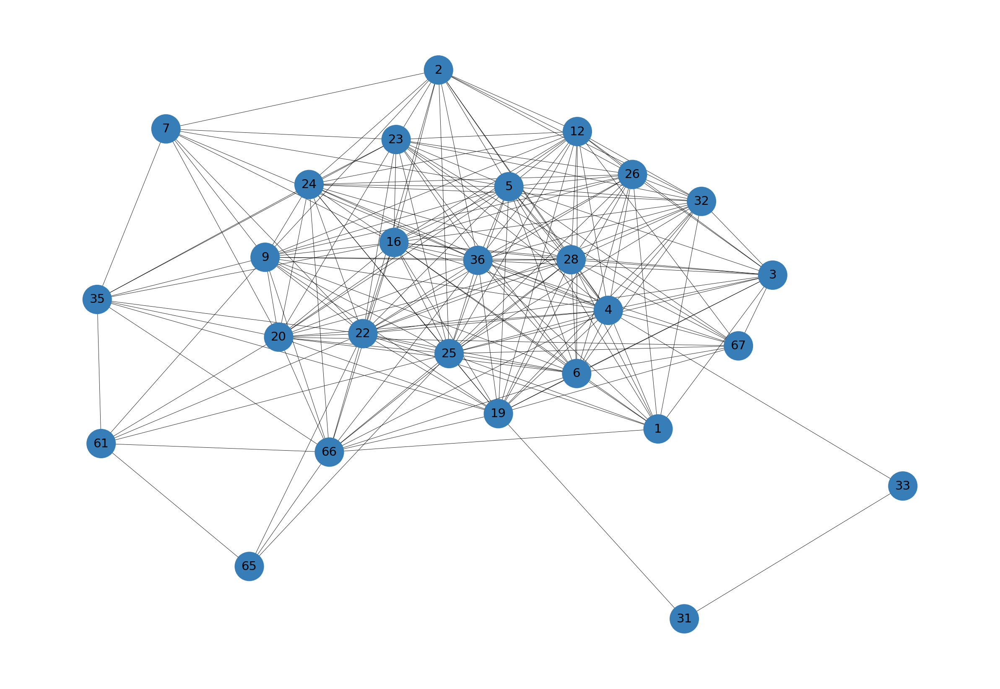

In [105]:
plot_group(G_nurse)

In [106]:
longest_path(G_nurse)

3

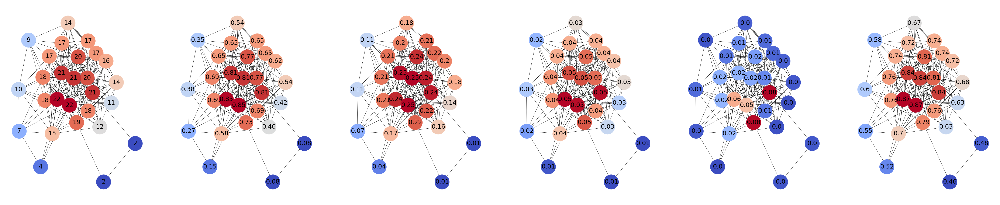

{'avg_degree': 14.962962962962964,
 'min_degree': 2,
 'max_degree': 22,
 'avg_degree_centrality': 0.5754985754985755,
 'min_degree_centrality': 0.07692307692307693,
 'max_degree_centrality': 0.8461538461538463,
 'avg_eigenvector_centrality': 0.17870735292048628,
 'min_eigenvector_centrality': 0.013667968250738533,
 'max_eigenvector_centrality': 0.2503173450575164,
 'avg_pagerank': 0.037037037037037035,
 'min_pagerank': 0.013349750180091918,
 'max_pagerank': 0.052427957697800516,
 'avg_betweenness_centrality': 0.01811965811965812,
 'min_betweenness_centrality': 0.0,
 'max_betweenness_centrality': 0.08456902499210191,
 'avg_closeness_centrality': 0.7093605510316385,
 'min_closeness_centrality': 0.4642857142857143,
 'max_closeness_centrality': 0.8666666666666667,
 'graph': 'NUR'}

In [107]:
res_nur = centrality(G_nurse)
res_nur['graph'] = 'NUR'
res_nur

#### Doctors

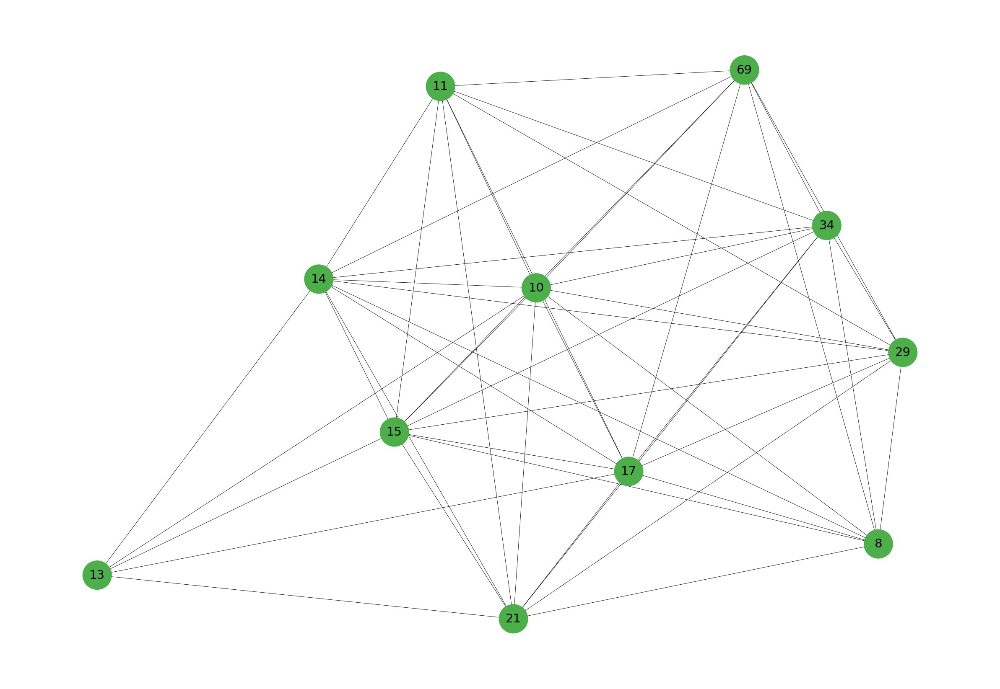

In [108]:
plot_group(G_doctor)

In [109]:
longest_path(G_doctor)

2

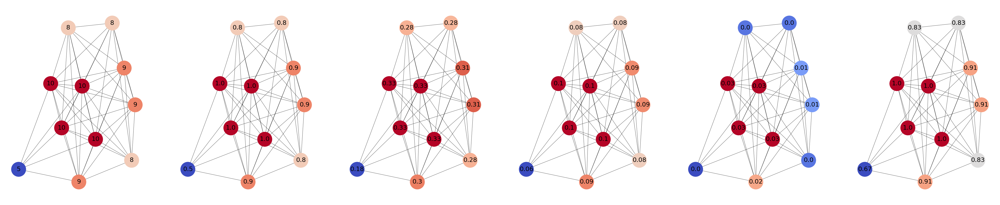

{'avg_degree': 8.727272727272727,
 'min_degree': 5,
 'max_degree': 10,
 'avg_degree_centrality': 0.8727272727272727,
 'min_degree_centrality': 0.5,
 'max_degree_centrality': 1.0,
 'avg_eigenvector_centrality': 0.29865742561981307,
 'min_eigenvector_centrality': 0.18235878067491668,
 'max_eigenvector_centrality': 0.3310976333984399,
 'avg_pagerank': 0.09090909090909093,
 'min_pagerank': 0.057432276105341795,
 'max_pagerank': 0.10277449942938058,
 'avg_betweenness_centrality': 0.014141414141414142,
 'min_betweenness_centrality': 0.0,
 'max_betweenness_centrality': 0.02888888888888889,
 'avg_closeness_centrality': 0.8994490358126721,
 'min_closeness_centrality': 0.6666666666666666,
 'max_closeness_centrality': 1.0,
 'graph': 'MED'}

In [110]:
res_med = centrality(G_doctor)
res_med['graph'] = 'MED'
res_med

#### Administrative staff

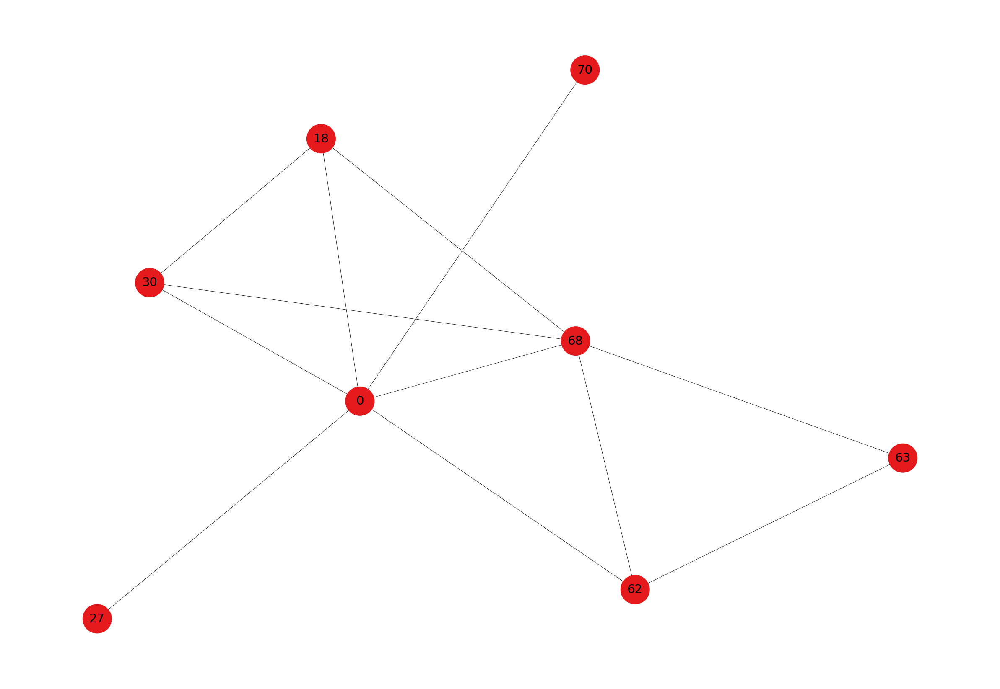

In [111]:
plot_group(G_administrative)

In [112]:
longest_path(G_administrative)

3

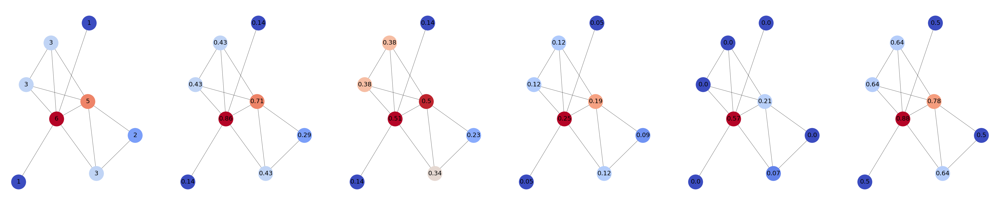

{'avg_degree': 3.0,
 'min_degree': 1,
 'max_degree': 6,
 'avg_degree_centrality': 0.42857142857142844,
 'min_degree_centrality': 0.14285714285714285,
 'max_degree_centrality': 0.8571428571428571,
 'avg_eigenvector_centrality': 0.3261506882424552,
 'min_eigenvector_centrality': 0.13902592873834113,
 'max_eigenvector_centrality': 0.5100337561405114,
 'avg_pagerank': 0.12499999999999999,
 'min_pagerank': 0.053670601670633956,
 'max_pagerank': 0.24650108392085518,
 'avg_betweenness_centrality': 0.10714285714285714,
 'min_betweenness_centrality': 0.0,
 'max_betweenness_centrality': 0.5714285714285714,
 'avg_closeness_centrality': 0.6327335858585859,
 'min_closeness_centrality': 0.5,
 'max_closeness_centrality': 0.875,
 'graph': 'ADM'}

In [113]:
res_adm = centrality(G_administrative)
res_adm['graph'] = 'ADM'
res_adm

#### All together

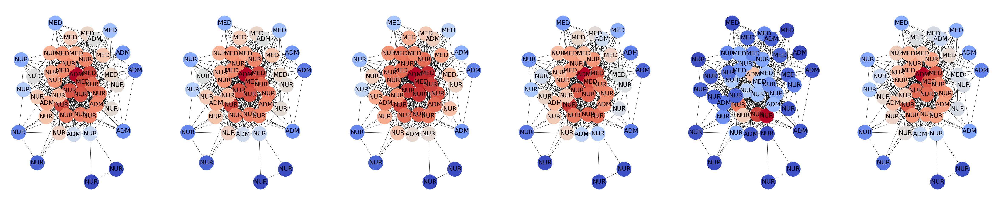

{'avg_degree': 24.043478260869566,
 'min_degree': 2,
 'max_degree': 40,
 'avg_degree_centrality': 0.5342995169082125,
 'min_degree_centrality': 0.044444444444444446,
 'max_degree_centrality': 0.888888888888889,
 'avg_eigenvector_centrality': 0.13595964859863965,
 'min_eigenvector_centrality': 0.006312157373924055,
 'max_eigenvector_centrality': 0.20925805936850383,
 'avg_pagerank': 0.021739130434782615,
 'min_pagerank': 0.006684120520435923,
 'max_pagerank': 0.034173460322957816,
 'avg_betweenness_centrality': 0.011220904699165568,
 'min_betweenness_centrality': 0.0,
 'max_betweenness_centrality': 0.057111570014593036,
 'avg_closeness_centrality': 0.6899464698683413,
 'min_closeness_centrality': 0.45,
 'max_closeness_centrality': 0.9,
 'graph': 'STAFF'}

In [114]:
res_staff = centrality(G_staff, staff_node_labels)
res_staff['graph'] = 'STAFF'
res_staff

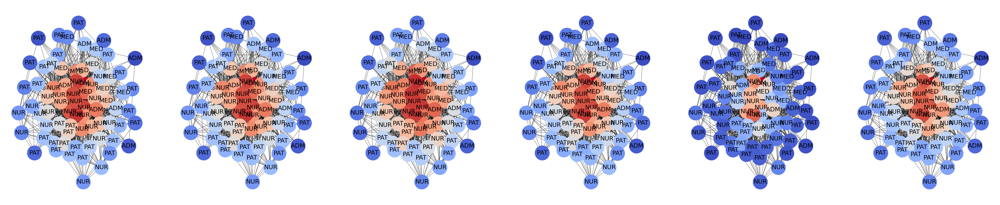

{'avg_degree': 30.373333333333335,
 'min_degree': 6,
 'max_degree': 61,
 'avg_degree_centrality': 0.4104504504504506,
 'min_degree_centrality': 0.08108108108108109,
 'max_degree_centrality': 0.8243243243243243,
 'avg_eigenvector_centrality': 0.10534553367198249,
 'min_eigenvector_centrality': 0.02177293274188552,
 'max_eigenvector_centrality': 0.19022428951343226,
 'avg_pagerank': 0.01333333333333334,
 'min_pagerank': 0.004350888582142247,
 'max_pagerank': 0.025364303415755688,
 'avg_betweenness_centrality': 0.008189559422436137,
 'min_betweenness_centrality': 3.6587756168739245e-05,
 'max_betweenness_centrality': 0.040408304449621735,
 'avg_closeness_centrality': 0.6377306894522919,
 'min_closeness_centrality': 0.4966442953020134,
 'max_closeness_centrality': 0.8505747126436781,
 'graph': 'ALL'}

In [115]:
res_all = centrality(G, default_node_labels)
res_all['graph'] = 'ALL'
res_all

In [116]:
results = pd.DataFrame([res_med, res_nur, res_adm, res_staff, res_all])

In [137]:
latex = results.T
latex.columns = results['graph']

In [148]:
latex = latex.reindex(['min_degree', 'avg_degree', 'max_degree',
               'min_degree_centrality', 'avg_degree_centrality', 'max_degree_centrality',
               'min_eigenvector_centrality', 'avg_eigenvector_centrality', 'max_eigenvector_centrality',
               'min_pagerank', 'avg_pagerank', 'max_pagerank',
               'min_betweenness_centrality', 'avg_betweenness_centrality', 'max_betweenness_centrality',
               'min_closeness_centrality', 'avg_closeness_centrality', 'max_closeness_centrality', 
              ])
latex.astype(float).round(2)

graph,MED,NUR,ADM,STAFF,ALL
min_degree,5.00,2.00,1.00,2.00,6.00
avg_degree,8.73,14.96,3.00,24.04,30.37
max_degree,10.00,22.00,6.00,40.00,61.00
min_degree_centrality,0.50,0.08,0.14,0.04,0.08
avg_degree_centrality,0.87,0.58,0.43,0.53,0.41
max_degree_centrality,1.00,0.85,0.86,0.89,0.82
min_eigenvector_centrality,0.18,0.01,0.14,0.01,0.02
avg_eigenvector_centrality,0.30,0.18,0.33,0.14,0.11
max_eigenvector_centrality,0.33,0.25,0.51,0.21,0.19
min_pagerank,0.06,0.01,0.05,0.01,0.00


<AxesSubplot:>

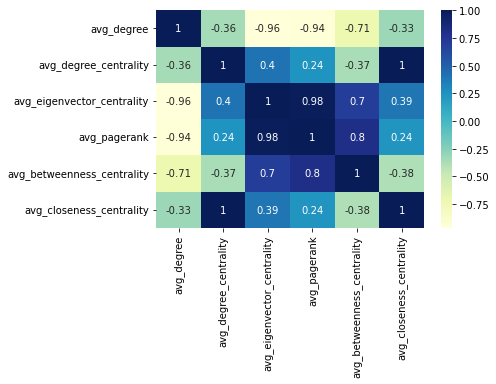

In [151]:
hm = results[['avg_degree', 'avg_degree_centrality', 'avg_eigenvector_centrality', 'avg_pagerank', 'avg_betweenness_centrality',
               'avg_closeness_centrality'
              ]].corr()
sns.heatmap(hm, annot=True, cmap="YlGnBu")

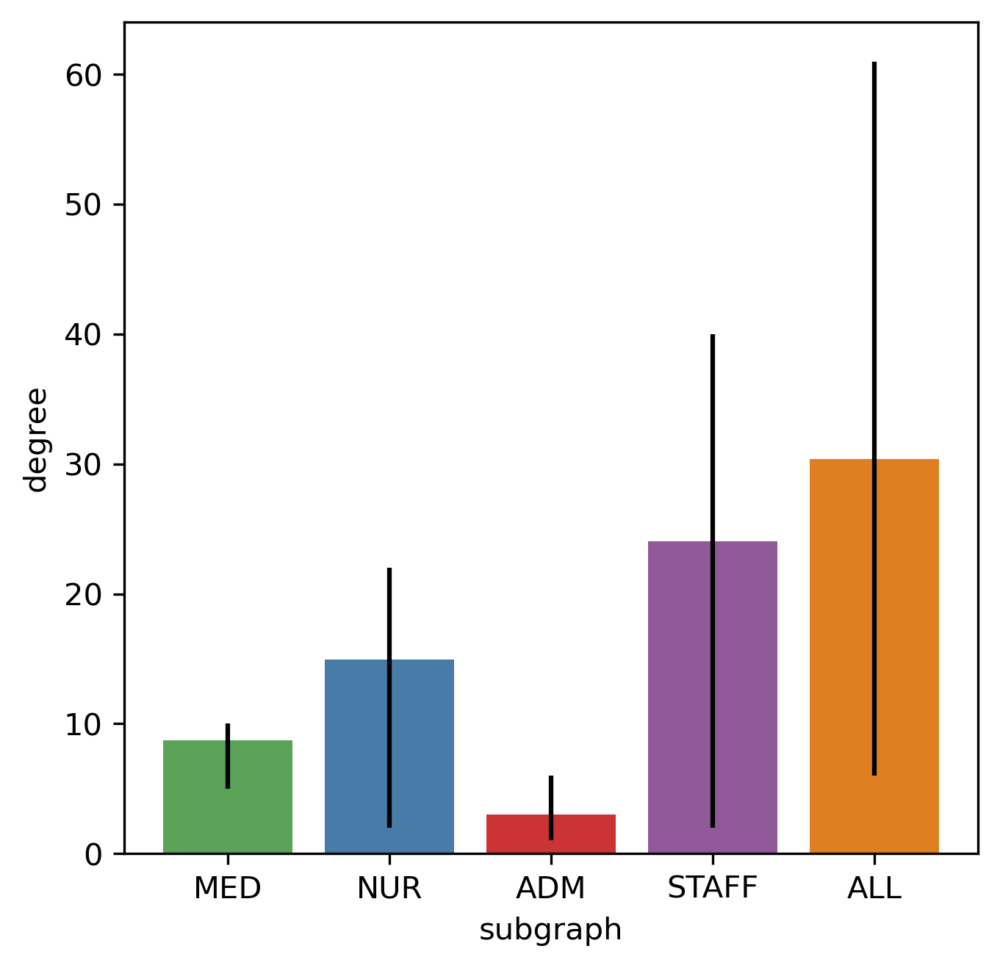

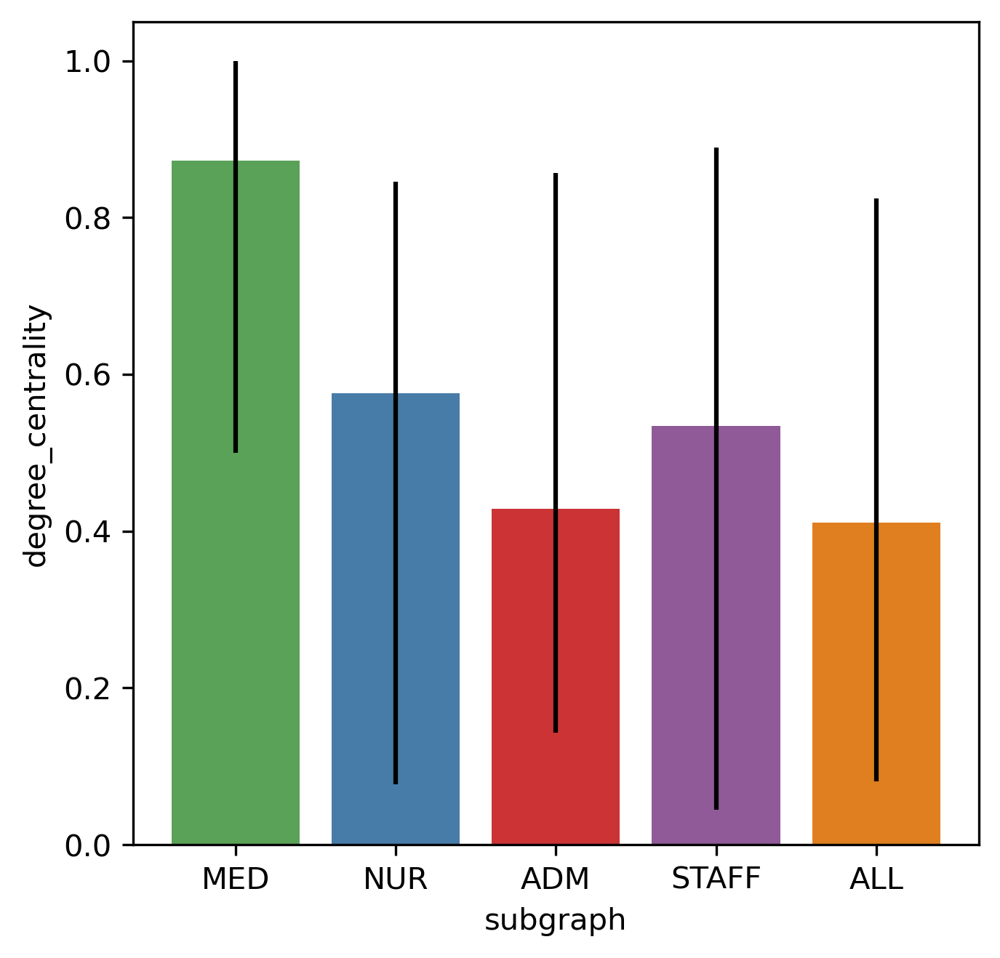

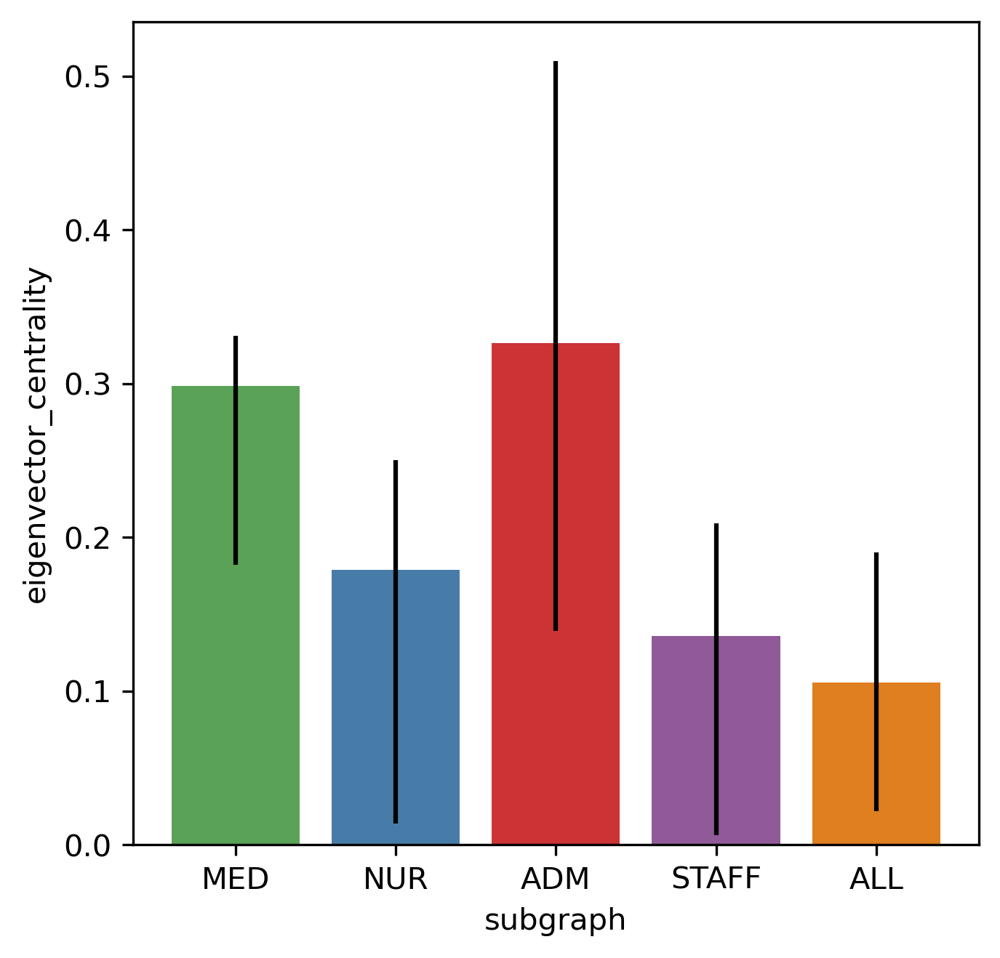

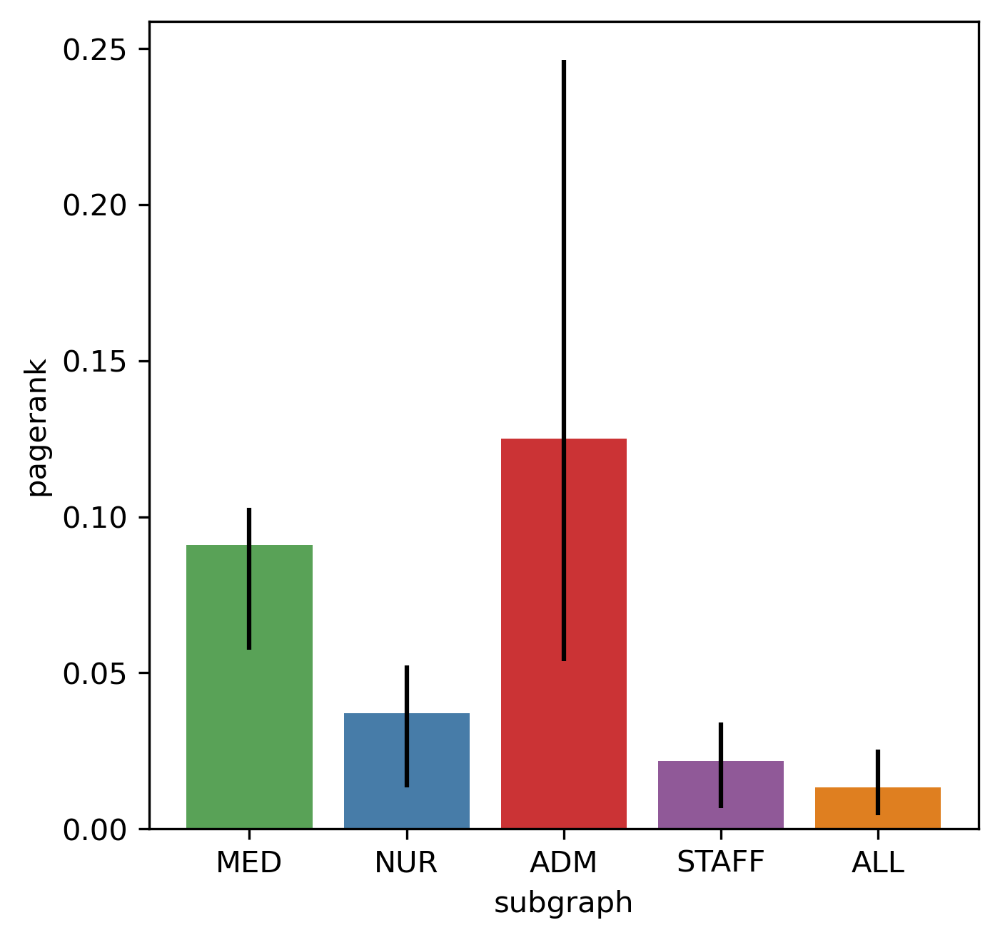

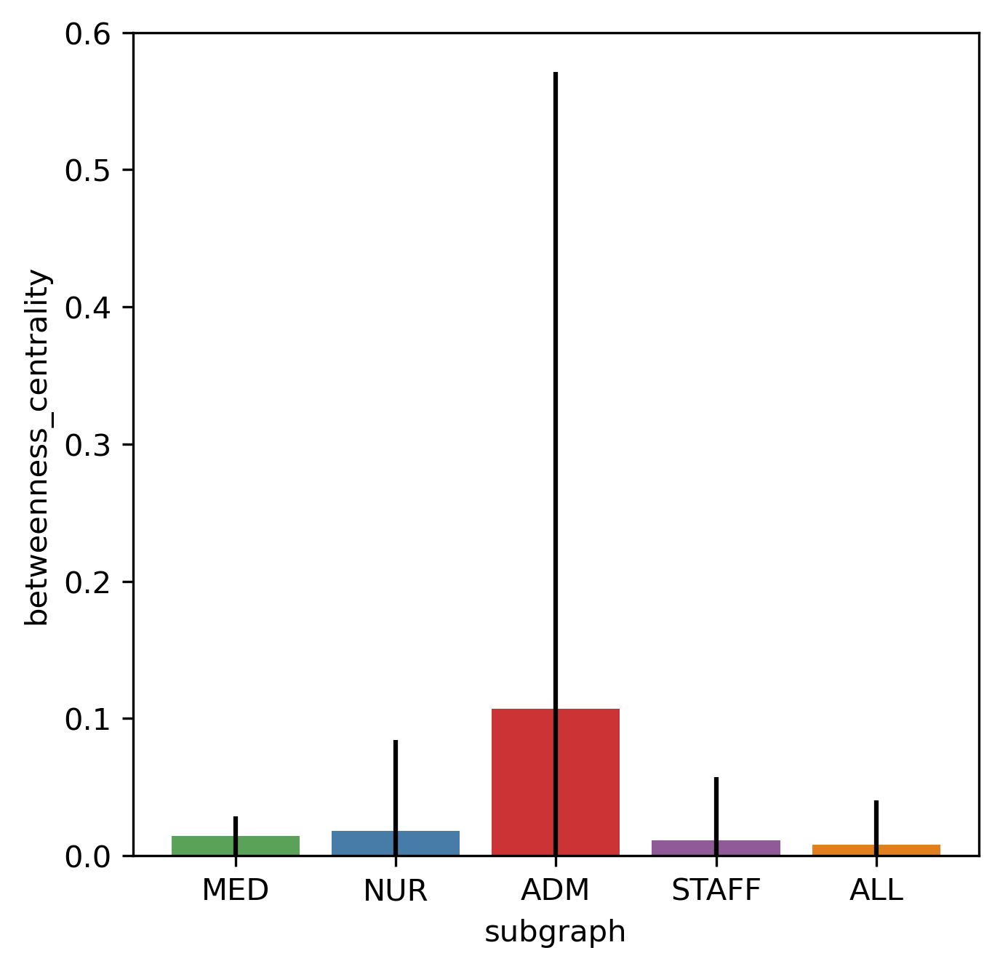

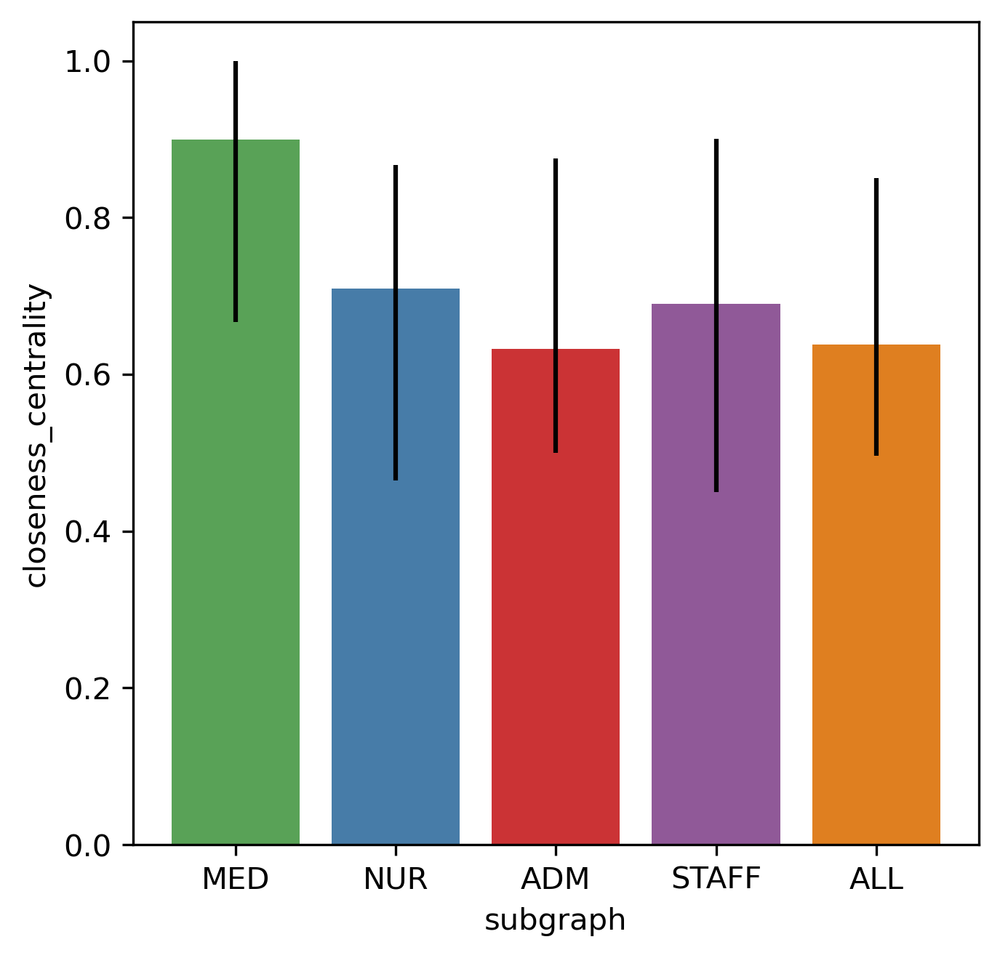

In [127]:
red = matplotlib.pyplot.get_cmap("Set1").colors[0]
blue = matplotlib.pyplot.get_cmap("Set1").colors[1]
green = matplotlib.pyplot.get_cmap("Set1").colors[2]
idk = matplotlib.pyplot.get_cmap("Set1").colors[3]
idk2 = matplotlib.pyplot.get_cmap("Set1").colors[4]
subdata = results
measures = ['degree', 'degree_centrality', 'eigenvector_centrality', 'pagerank', 'betweenness_centrality', 'closeness_centrality']
for measure in measures:
    fig, ax = plt.subplots(figsize=(5, 5), dpi=300)
    sns.barplot(data=subdata, x="graph", y="avg_" + measure, palette=[green, blue, red, idk, idk2])
    x = subdata.index
    y = subdata['avg_' + measure]
    y_err_min = y - subdata['min_'+measure]
    y_err_max = subdata['max_' + measure] - y
    plt.errorbar(x, y, yerr=[y_err_min, y_err_max], fmt='none', ecolor='black')
    ax.set_ylabel(measure)
    ax.set_xlabel("subgraph")
    plt.show()